In [1]:
import pandas as pd
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
empa_path = "Empatica"
fitbit_path = "Fitbit"
empa_rest_cols = ["Timestamp.time", "HR_biosignalsplux", "HR_empatica", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']", "Prediction_['HR_empatica']"]
empa_intense_cols = ["Timestamp.time", "HR_empatica", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']", "Prediction_['HR_empatica']", "HR_polarh10"]
fitbit_rest_cols = ["Timestamp.time", "HR_biosignalsplux", "HR_fitbit", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']", "Prediction_['HR_fitbit']"]
fitbit_intense_cols = ["Timestamp.time", "HR_fitbit", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']", "Prediction_['HR_fitbit']", "HR_polarh10"]

In [3]:
sub_path = os.path.join(empa_path, "Resting")
empa_files = os.listdir(sub_path)
for d in empa_files:
    a = pd.read_csv(os.path.join(sub_path, d))
    tmp_cols = a.columns.tolist()
    is_complete = True
    for cols in empa_rest_cols:
        if cols not in tmp_cols:
            print(cols)
            is_complete = False
    if not is_complete:
        continue

Timestamp.time
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']
Prediction_['HR_empatica']
Timestamp.time
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']
Prediction_['HR_empatica']


In [4]:
def plot_empatica(sub):
    sub_path = os.path.join(empa_path, sub)
    empa_files = os.listdir(sub_path)
    empa_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in empa_files]
    empa_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = empa_intense_cols
        else:
            needed_cols = empa_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                is_complete = False
        if not is_complete:
            continue
        else:
            empa_data.append((data[0], data[1][needed_cols]))
            
    
    pick_index = []
    for data in empa_data:
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(empa_data):
        empa_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]])
    
    for data in empa_data:
        fig = plt.figure(figsize=(15,8))
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']"], "y+", label="HR_empatica-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_empatica']"], "bo", label="HR_empatica-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_empatica"], "rs", label="HR_empatica", linestyle="-")
        
        if sub.lower() == "intensity":
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_empatica-prediction with PA", "HR_empatica-prediction without PA", "HR_polarh10", "HR_empatica"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_empatica-prediction with PA", "HR_empatica-prediction without PA", "HR_biosignalsplux(ECG)", "HR_empatica"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(Empatica)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
        plt.show()

In [5]:
def plot_fitbit(sub):
    sub_path = os.path.join(fitbit_path, sub)
    fitbit_files = os.listdir(sub_path)
    fitbit_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in fitbit_files]
    fitbit_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = fitbit_intense_cols
        else:
            needed_cols = fitbit_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                print(col)
                is_complete = False
        if not is_complete:
            continue
        else:
            fitbit_data.append((data[0], data[1][needed_cols]))
    
    
    pick_index = []
    for data in fitbit_data:
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(fitbit_data):
        fitbit_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]])
    
    for data in fitbit_data:
        fig = plt.figure(figsize=(15,8))
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']"], "y+", label="HR_fitbit-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_fitbit']"], "bo", label="HR_fitbit-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_fitbit"], "rs", label="HR_fitbit", linestyle="-")
        
        if sub.lower() == "intensity":
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_polarh10", "HR_fitbit"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_biosignalsplux(ECG)", "HR_fitbit"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(Fitbit)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
        plt.show()

In [139]:
def pick_point_to_plot(data, minute):
    start = data.shape[0]//minute
    for i, t in enumerate(data["Timestamp.time"][start + 1:]):
        differ = datetime.strptime(t, "%H:%M:%S") - datetime.strptime(data["Timestamp.time"][start], "%H:%M:%S")
        if differ.total_seconds() >= 300:
            print(data["Timestamp.time"][start], data["Timestamp.time"][start+i+1])
            return (start, start + i + 1)
    print(data["Timestamp.time"][0], data["Timestamp.time"][data.shape[0]-1])
    return (0, data.shape[0] - 1)

In [147]:
def get_empa_point(sub):
    sub_path = os.path.join(empa_path, sub)
    empa_files = os.listdir(sub_path)
    empa_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in empa_files]
    empa_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = empa_intense_cols
        else:
            needed_cols = empa_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                print(data[0],col)
                is_complete = False
        if not is_complete:
            continue
        else:
            empa_data.append((data[0], data[1][needed_cols]))
    
    
    pick_index = []
    for data in empa_data:
        print(data[0])
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(empa_data):
        empa_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]+1])
    
    return empa_data

    
def subplot_empa(data_tuple):
    fig = plt.figure(figsize=(15,30))
    for i, data in enumerate(data_tuple):
        plt.subplot(3, 1, i+1)
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']"], "y+", label="HR_empatica-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_empatica']"], "bo", label="HR_empatica-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_empatica"], "rs", label="HR_empatica", linestyle="-")
        
        if "intensity" in data[0].lower():
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_empatica-prediction with PA", "HR_empatica-prediction without PA", "HR_polarh10", "HR_empatica"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_empatica-prediction with PA", "HR_empatica-prediction without PA", "HR_biosignalsplux(ECG)", "HR_empatica"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(empatica)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
    
    if not os.path.exists(os.path.join("subplot_result","Empatica")):
        os.makedirs(os.path.join("subplot_result","Empatica"))
    if data_tuple[0][0][:9][-1] == "_":
        plt.savefig(os.path.join("subplot_result","Empatica",data_tuple[0][0][:8] + "_Empatica"))
    else:
        plt.savefig(os.path.join("subplot_result","Empatica",data_tuple[0][0][:9] + "_Empatica"))
    #plt.show()
    

In [145]:
def get_fitbit_point(sub):
    sub_path = os.path.join(fitbit_path, sub)
    fitbit_files = os.listdir(sub_path)
    fitbit_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in fitbit_files]
    fitbit_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = fitbit_intense_cols
        else:
            needed_cols = fitbit_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                print(data[0],col)
                is_complete = False
        if not is_complete:
            continue
        else:
            fitbit_data.append((data[0], data[1][needed_cols]))
    
    
    pick_index = []
    for data in fitbit_data:
        print(data[0])
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(fitbit_data):
        fitbit_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]+1])
    
    return fitbit_data

    
def subplot_fitbit(data_tuple):
    fig = plt.figure(figsize=(15,30))
    for i, data in enumerate(data_tuple):
        plt.subplot(3, 1, i+1)
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']"], "y+", label="HR_fitbit-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_fitbit']"], "bo", label="HR_fitbit-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_fitbit"], "rs", label="HR_fitbit", linestyle="-")
        
        if "intensity" in data[0].lower():
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_polarh10", "HR_fitbit"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_biosignalsplux(ECG)", "HR_fitbit"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(Fitbit)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
    
    if not os.path.exists(os.path.join("subplot_result","Fitbit")):
        os.makedirs(os.path.join("subplot_result","Fitbit"))
    if data_tuple[0][0][:9][-1] == "_":
        plt.savefig(os.path.join("subplot_result","Fitbit",data_tuple[0][0][:8] + "_Fitbit"))
    else:
        plt.savefig(os.path.join("subplot_result","Fitbit",data_tuple[0][0][:9] + "_Fitbit"))
    #plt.show()
    

In [148]:
fitbit_intense = get_fitbit_point("intensity")
fitbit_sleep = get_fitbit_point("sleeping")
fitbit_rest = get_fitbit_point("resting")

fitbit_intense.sort()
fitbit_sleep.sort()
fitbit_rest.sort()

empa_intense = get_empa_point("intensity")
empa_sleep = get_empa_point("sleeping")
empa_rest = get_empa_point("resting")

empa_intense.sort()
empa_sleep.sort()
empa_rest.sort()

Subject13_Intensity_Prediction.csv Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Subject13_Intensity_Prediction.csv Prediction_['HR_fitbit']
Subject11_Intensity_Prediction.csv
16:59:10 17:04:20
Subject12_Intensity_Prediction.csv
16:59:30 17:04:30
Subject14_Intensity_Prediction.csv
16:58:05 17:03:05
Subject15_Intensity_Prediction.csv
16:43:55 16:49:00
Subject16_Intensity_Prediction.csv
16:33:45 16:34:25
Subject17_Intensity_Prediction.csv
17:58:50 18:03:50
Subject18_Intensity_Prediction.csv
16:38:15 16:43:15
Subject19_Intensity_Prediction.csv
16:09:40 16:14:50
Subject1_Intensity_Prediction.csv
17:04:35 17:09:35
Subject20_Intensity_Prediction.csv
18:03:35 18:08:40
Subject21_Intensity_Prediction.csv
16:46:20 16:51:20
Subject2_Intensity_Prediction.csv
16:01:30 16:06:30
Subject3_Intensity_Prediction.csv
16:07:00 16:12:00
Subject4_Intensity_Prediction.csv
16:52:40 16:57:40
Subject5_Intensity_Prediction.csv
16:07:20 16:12:20
Subject6_Intensity_Prediction.csv
16:31:10 16:36:10
Sub

Subject11 Subject11 Subject11
Subject12 Subject12 Subject12
Subject14 Subject14 Subject14
Subject15 Subject15 Subject15
Subject17 Subject17 Subject17
Subject18 Subject18 Subject18
Subject20 Subject20 Subject20
Subject21 Subject21 Subject21
Subject2_ Subject2_ Subject2_
Subject3_ Subject3_ Subject3_
Subject4_ Subject4_ Subject4_
Subject6_ Subject6_ Subject6_
Subject7_ Subject7_ Subject7_
Subject8_ Subject8_ Subject8_
Subject9_ Subject9_ Subject9_


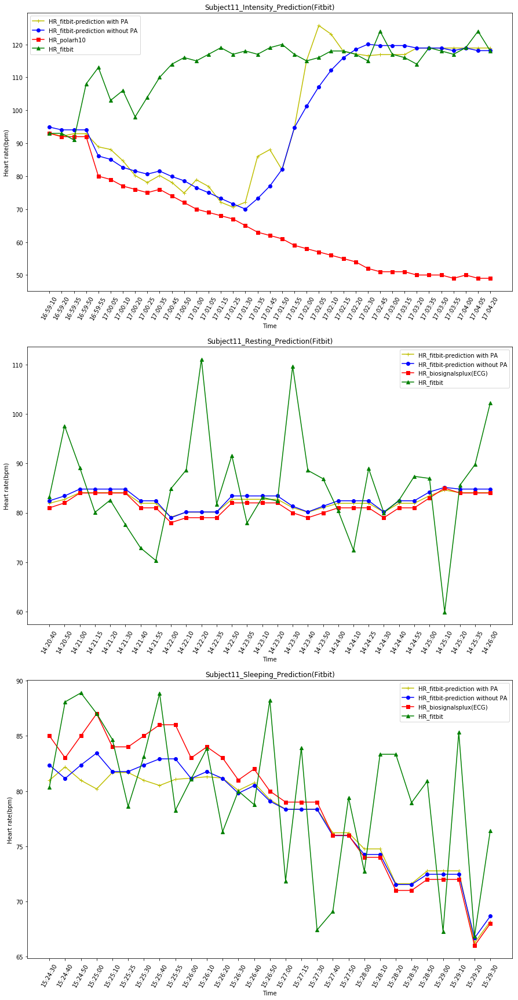

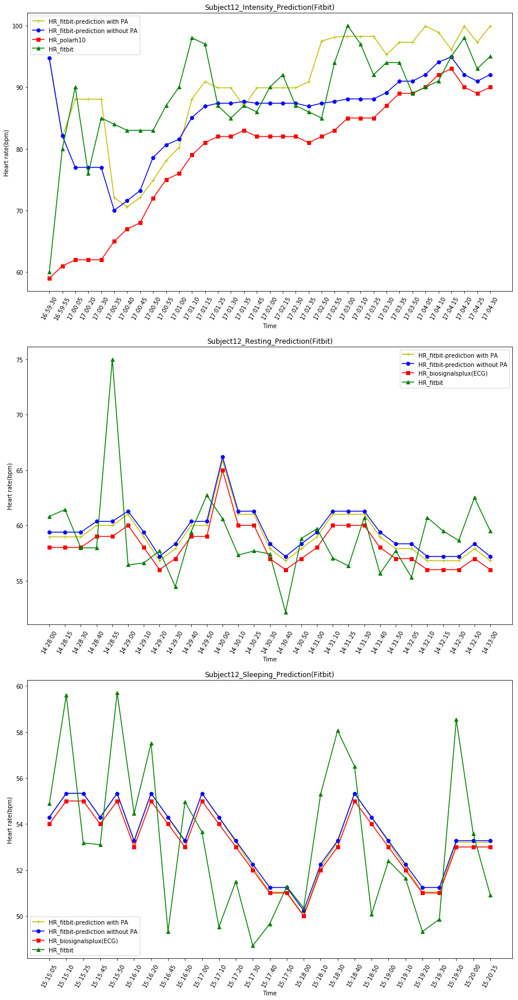

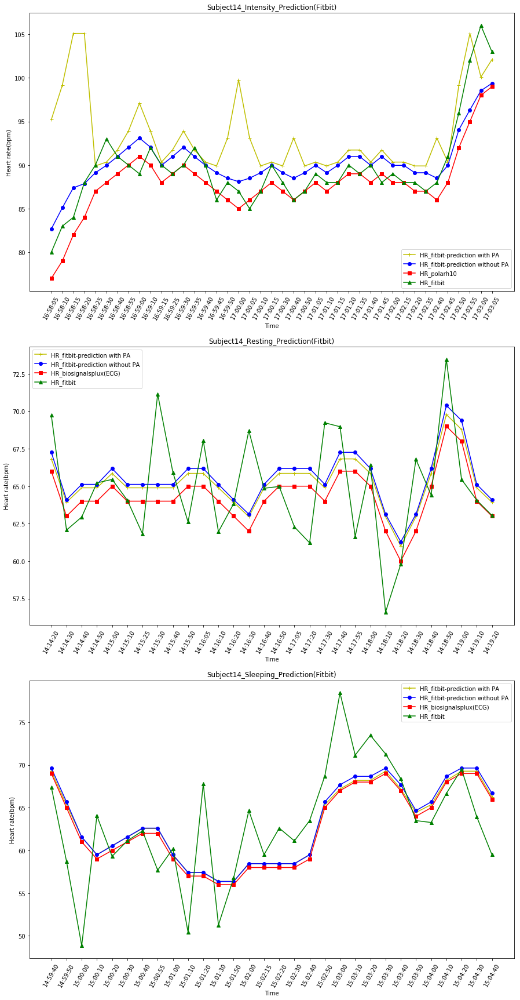

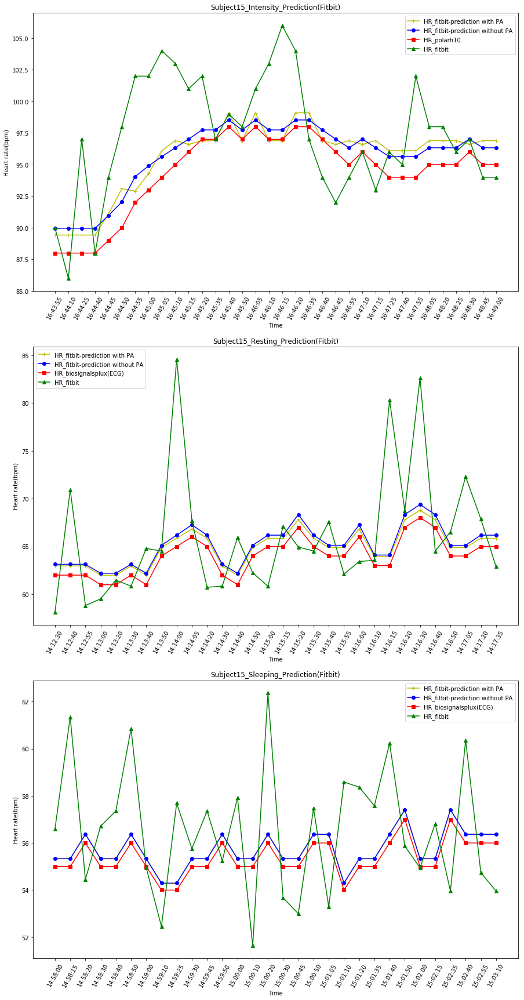

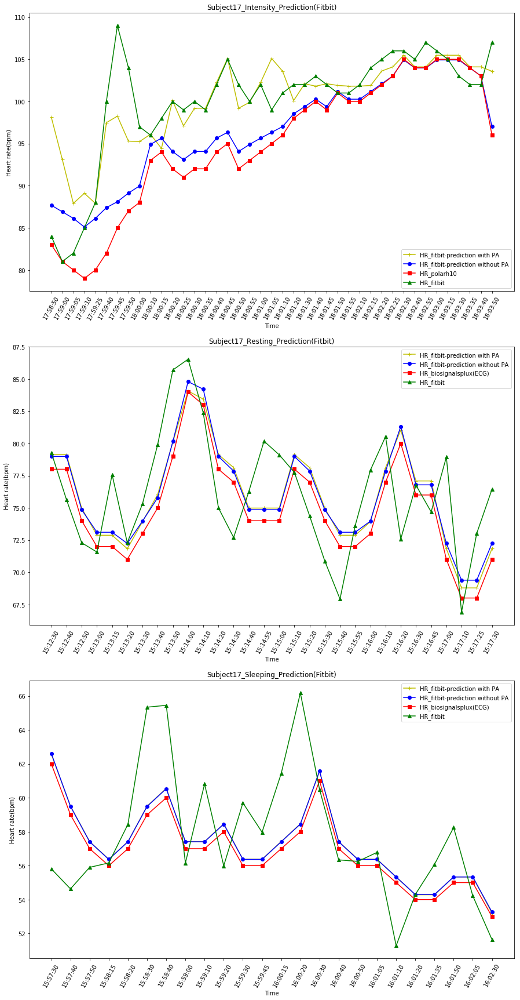

...

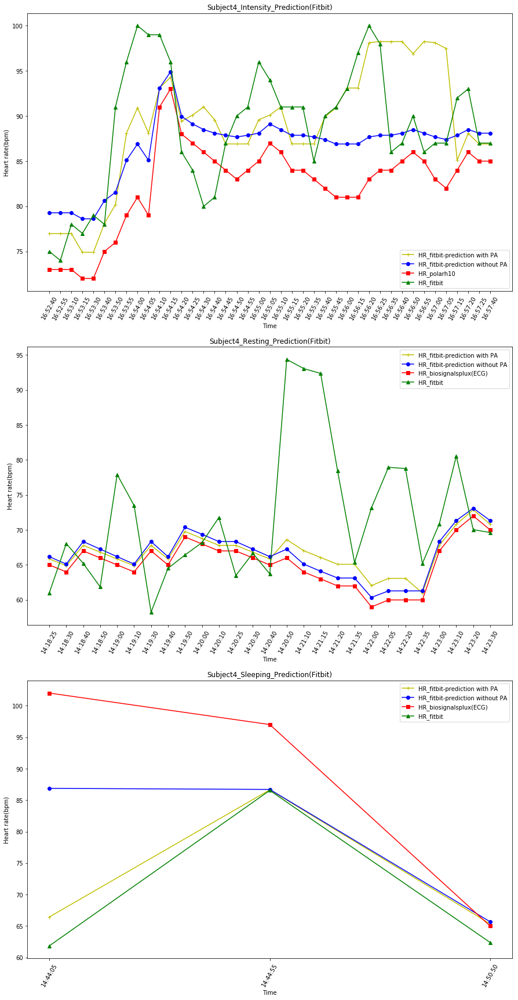

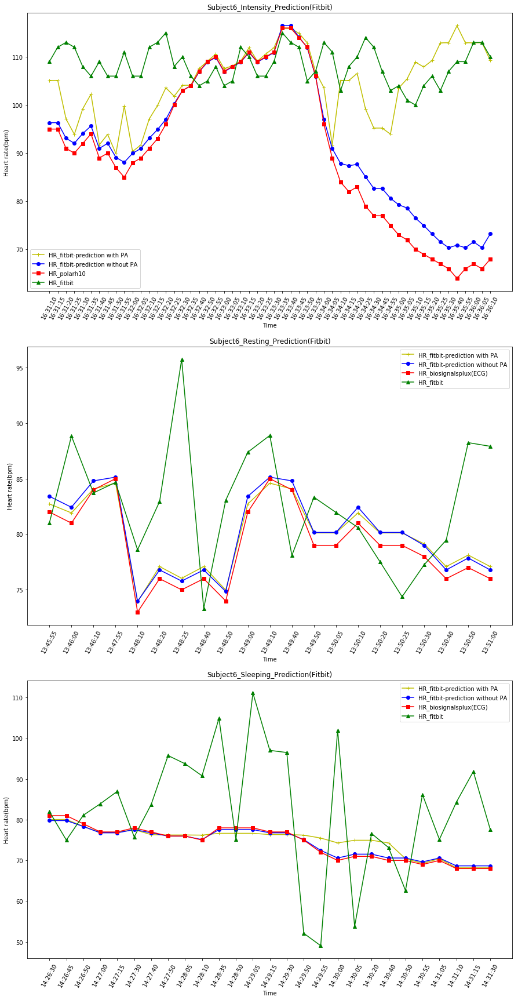

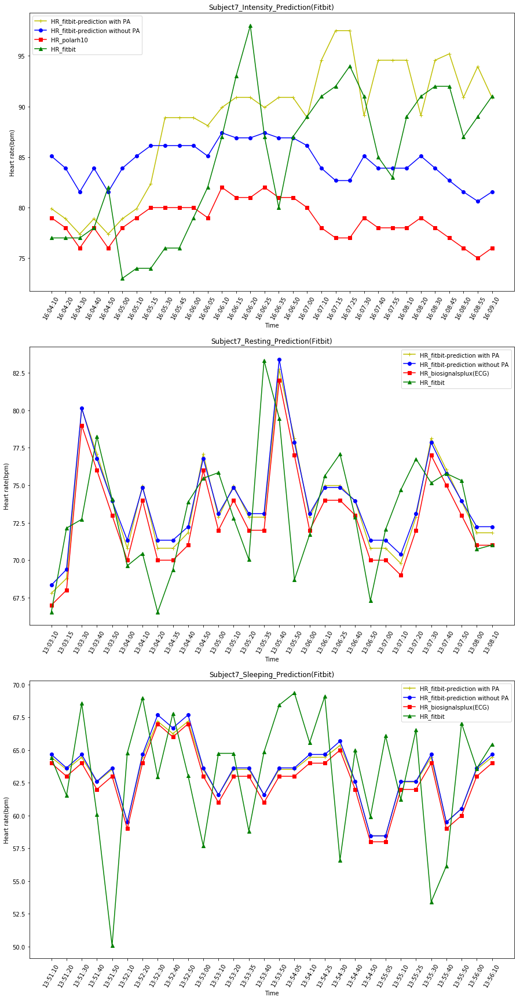

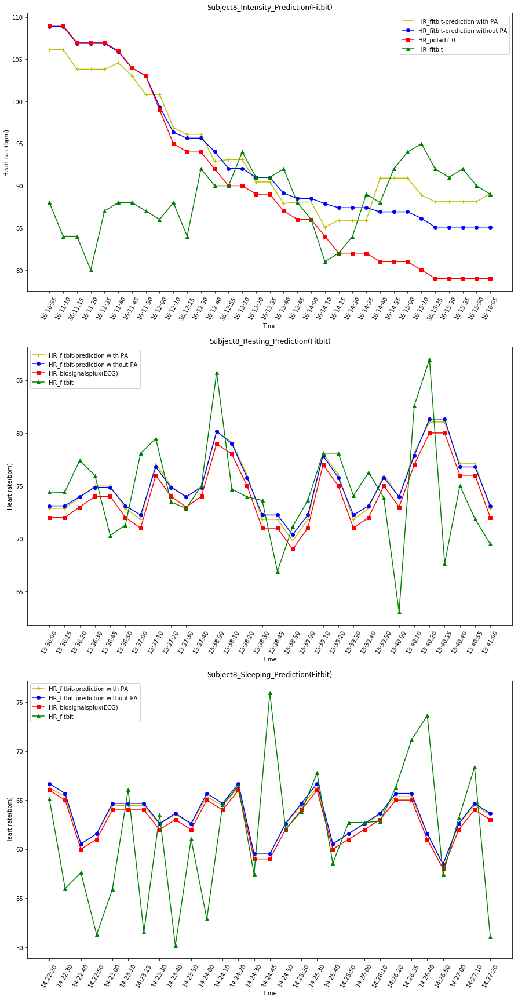

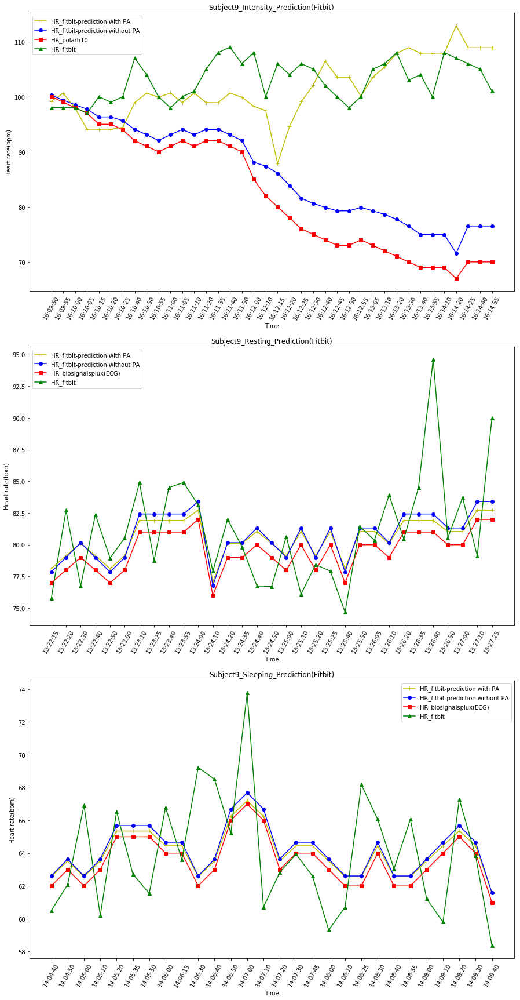

In [149]:
result = list()
for d1 in fitbit_intense:
    true1 = False
    for d2 in fitbit_rest:
        if true1:
            break
        if d1[0][:9] == d2[0][:9]:
            for d3 in fitbit_sleep:
                if d1[0][:9] == d3[0][:9]:
                    print(d1[0][:9], d2[0][:9], d3[0][:9])
                    result.append((d1,d2,d3))
                    true1 = True
                    break
                    
for r in result:
    subplot_fitbit(r)

Subject10 Subject10 Subject10
Subject11 Subject11 Subject11
Subject12 Subject12 Subject12
Subject14 Subject14 Subject14
Subject15 Subject15 Subject15
Subject17 Subject17 Subject17
Subject18 Subject18 Subject18
Subject20 Subject20 Subject20
Subject21 Subject21 Subject21
Subject3_ Subject3_ Subject3_
Subject6_ Subject6_ Subject6_
Subject7_ Subject7_ Subject7_
Subject8_ Subject8_ Subject8_
Subject9_ Subject9_ Subject9_


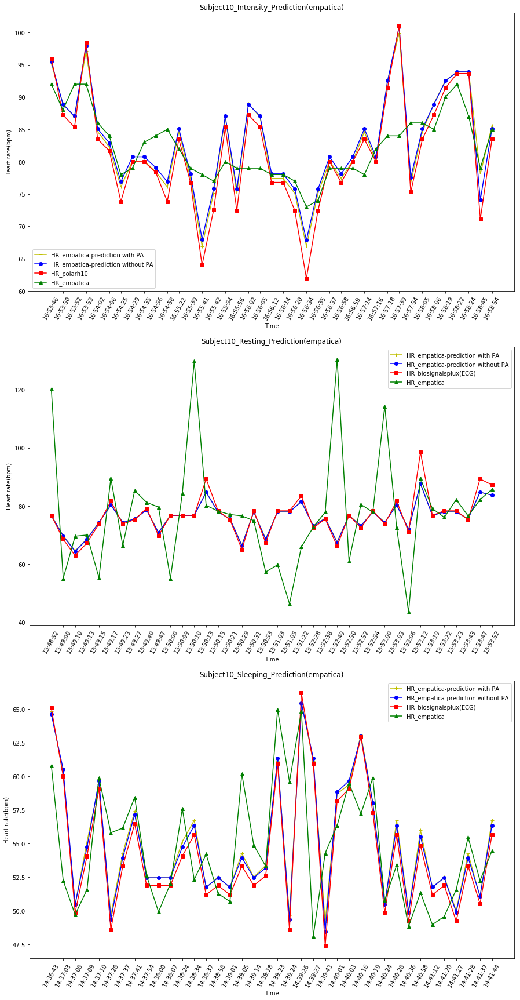

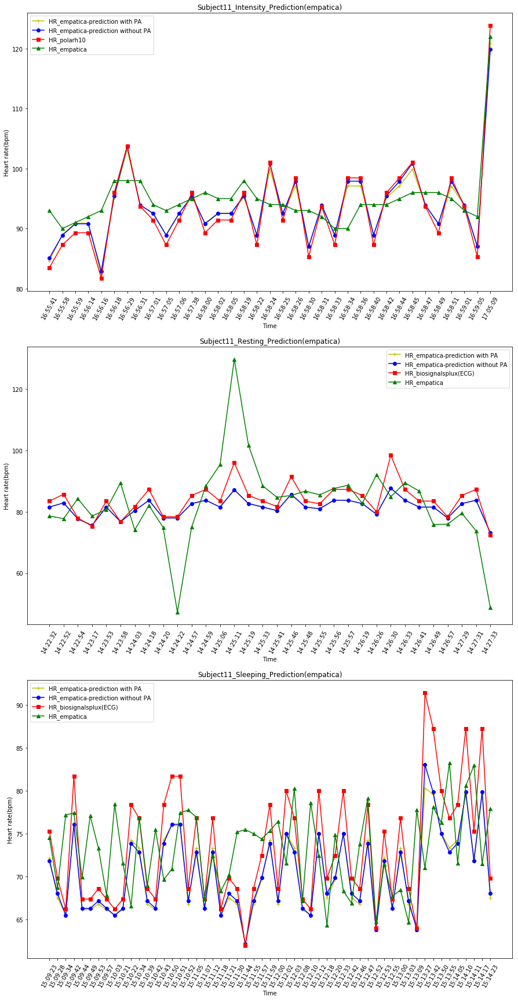

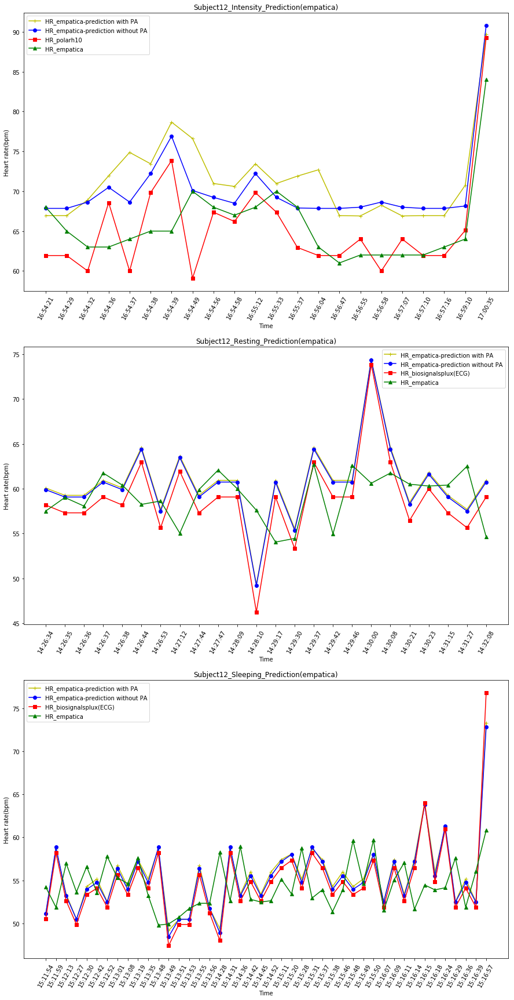

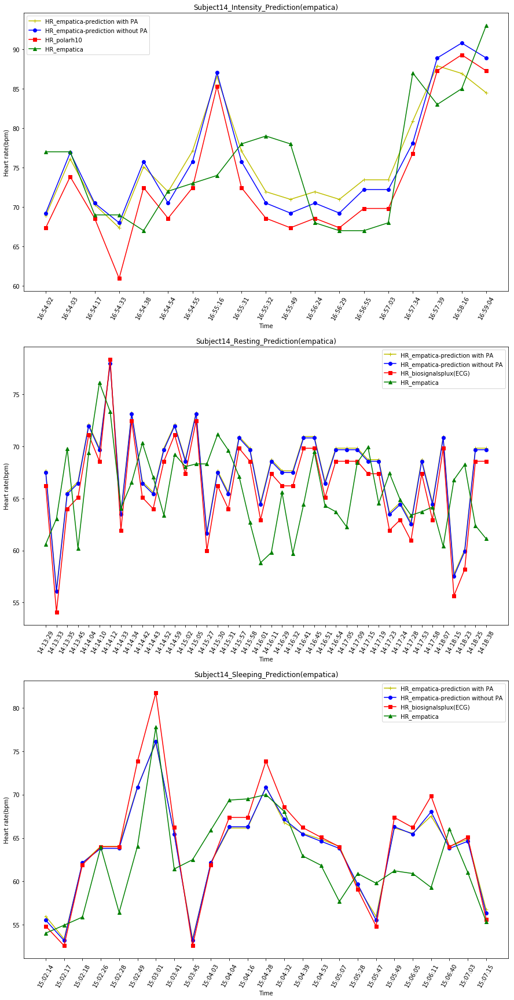

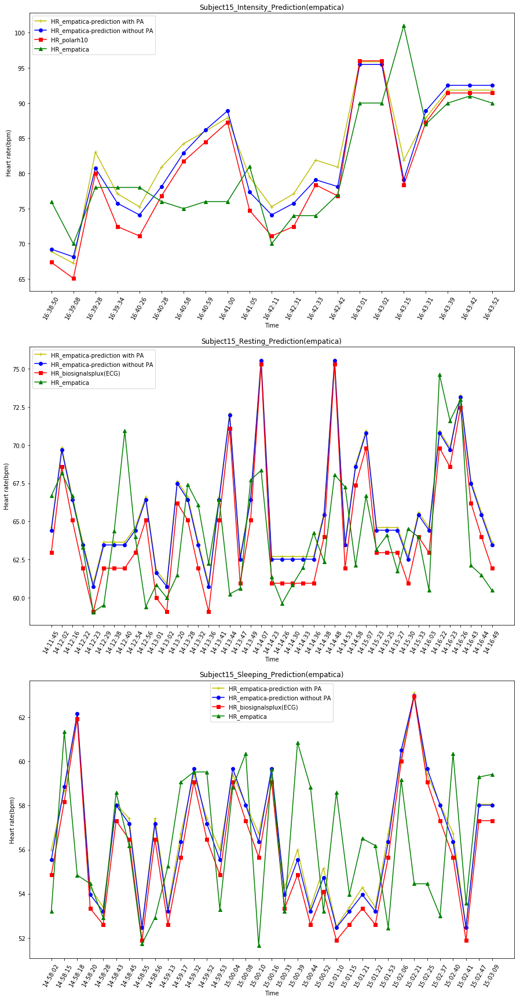

...

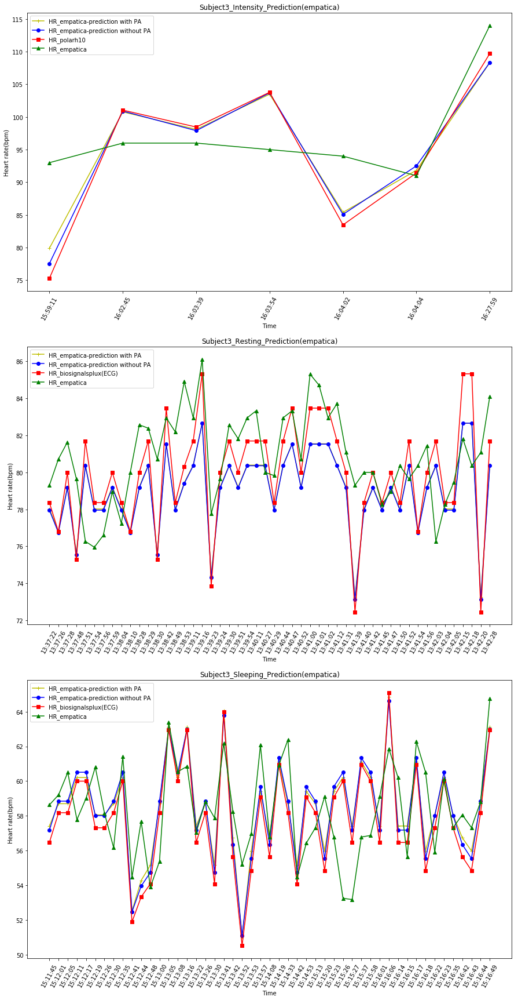

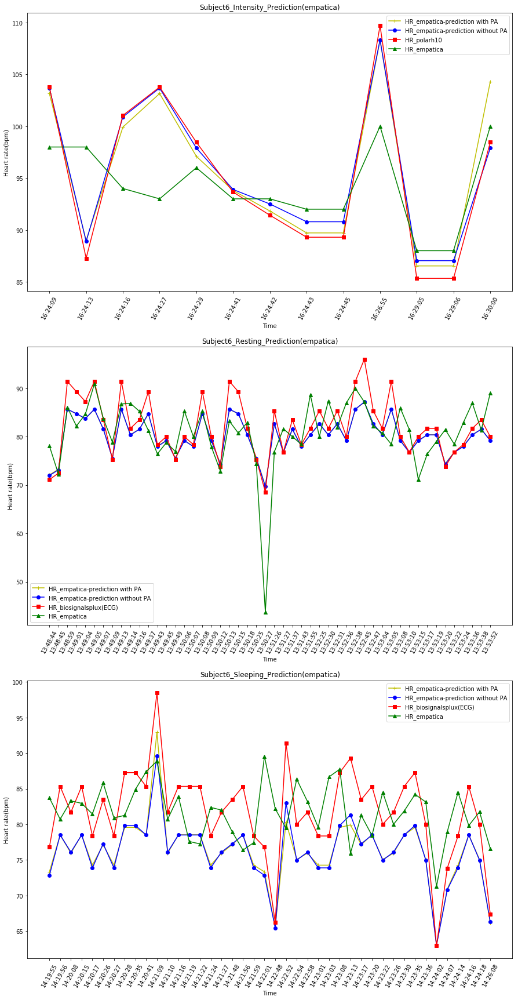

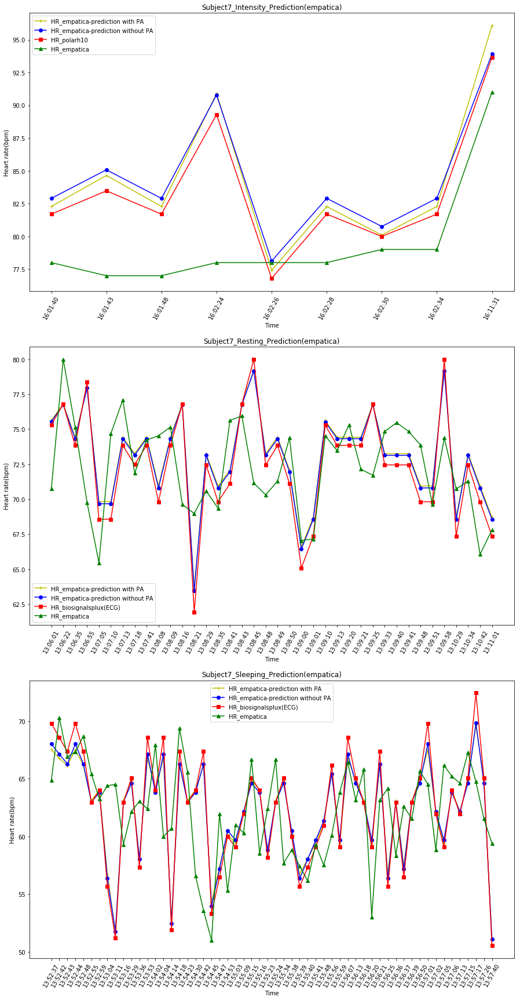

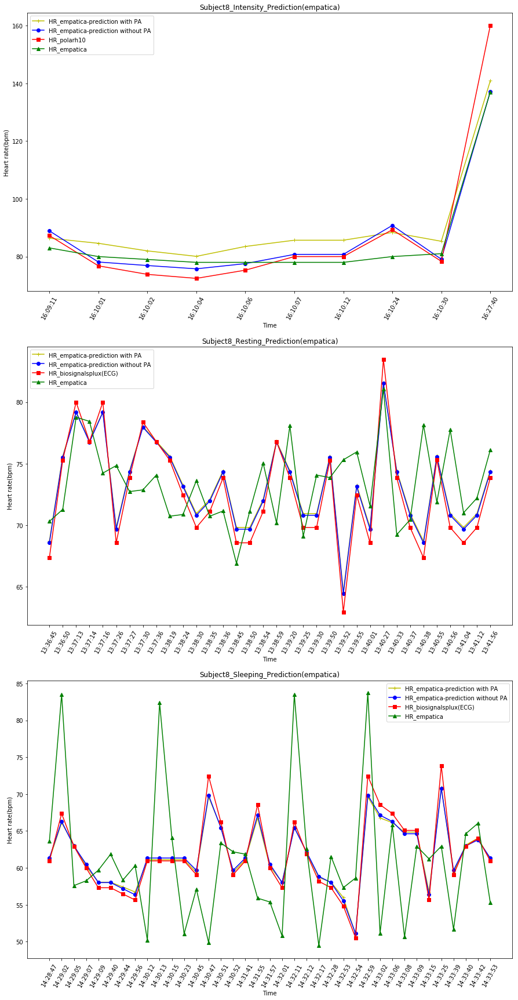

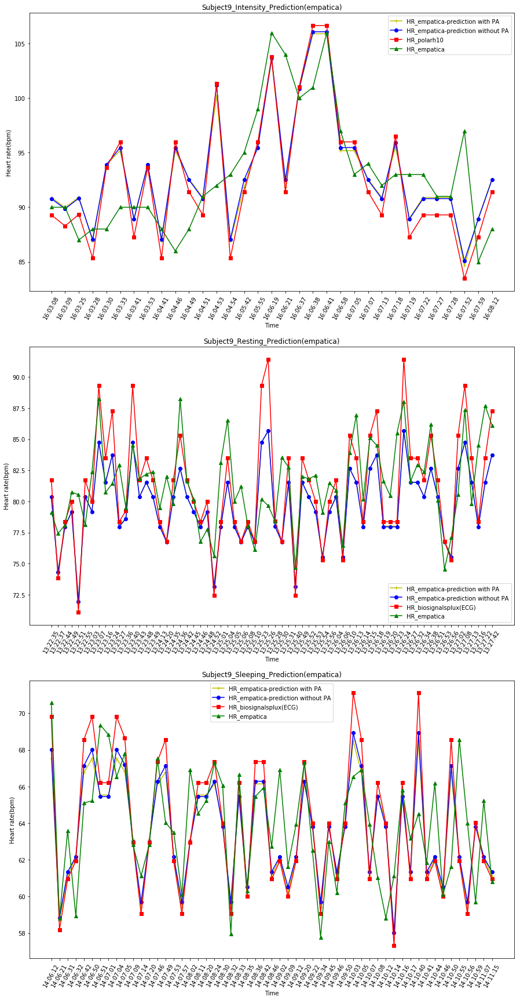

In [150]:
result = list()
for d1 in empa_intense:
    true1 = False
    for d2 in empa_rest:
        if true1:
            break
        if d1[0][:9] == d2[0][:9]:
            for d3 in empa_sleep:
                if d1[0][:9] == d3[0][:9]:
                    print(d1[0][:9], d2[0][:9], d3[0][:9])
                    result.append((d1,d2,d3))
                    true1 = True
                    break
                    
for r in result:
    subplot_empa(r)